<a href="https://colab.research.google.com/github/Vagueken/Appliances-Energy-Prediction/blob/main/Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Appliances Energy Prediction </u></b>

## <b> Problem Description </b>

###Data-driven prediction of energy use of appliances, The data set is at 10 min for about 4.5 months. The house temperature and humidity conditions were monitored with a ZigBee wireless sensor network. Each wireless node transmitted the temperature and humidity conditions around 3.3 min. Then, the wireless data was averaged for 10 minutes periods. The energy data was logged every 10 minutes with m-bus energy meters. Weather from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis (rp5.ru) and merged together with the experimental data sets using the date and time column. Two random variables have been included in the data set for testing the regression models and to filter out non-predictive attributes (parameters).


## <b> Data Description </b>

# <b>Attribute Information: </b>

* date time year-month-day hour:minute:second

* Appliances, energy use in Wh (Dependent variable)

* lights, energy use of light fixtures in the house in Wh (Drop this column)

* T1, Temperature in kitchen area, in Celsius

* RH1, Humidity in kitchen area, in % 

* T2, Temperature in living room area, in Celsius 

* RH2, Humidity in living room area, in %

* T3, Temperature in laundry room area

* RH3, Humidity in laundry room area, in % 

* T4, Temperature in office room, in Celsius 

* RH4, Humidity in office room, in %

* T5, Temperature in bathroom, in Celsius

* RH5, Humidity in bathroom, in % 

* T6, Temperature outside the building (north side), in Celsius

* RH6, Humidity outside the building (north side), in %

* T7, Temperature in ironing room , in Celsius

* RH7, Humidity in ironing room, in % 

* T8, Temperature in teenager room 2, in Celsius 

* RH8, Humidity in teenager room 2, in %

* T9, Temperature in parents room, in Celsius

* RH9, Humidity in parents room, in % 

* Tout, Temperature outside (from Chievres weather station), in
Celsius 

* Pressure (from Chievres weather station), in mm Hg 

* RHout, Humidity outside (from Chievres weather station), in %

* Wind speed (from Chievres weather station), in m/s

* Visibility (from Chievres weather station), in km

* Tdewpoint (from Chievres weather station), Â°C

* rv1, Random variable 1, nondimensional

* rv2, Random variable 2, nondimensional

<b> Where indicated, hourly data (then interpolated) from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis, rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of weather data. <b>

In [119]:
#importing libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import missingno as msno
from scipy. stats import norm 
from scipy import stats 
import warnings 
warnings.filterwarnings ('ignore')
%matplotlib inline

from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet

from statsmodels.stats.outliers_influence import variance_inflation_factor

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import KFold, GridSearchCV, RepeatedKFold, RandomizedSearchCV, learning_curve, cross_val_score
from sklearn.model_selection import cross_validate 
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import RandomizedSearchCV
from sklearn import ensemble
from math import sqrt

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor
import xgboost as xgb
from sklearn import neighbors
from sklearn.svm import SVR
import time
import dateutil
from sklearn.preprocessing import MinMaxScaler 
from sklearn.preprocessing import OneHotEncoder 
from sklearn.preprocessing import MultiLabelBinarizer 
from datetime import datetime, timezone, timedelta

from sklearn. metrics import r2_score 
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import mean_squared_log_error 
from scipy.stats import zscore 
from sklearn.metrics import roc_auc_score, accuracy_score




In [3]:
#mounting drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [120]:
#lOADING THE DATA

path = "/content/drive/MyDrive/AlmaBetter DS/Capstone Project/(Supervised ML - Regression) Appliances Energy Prediction/data_application_energy.csv"
data = pd.read_csv(path)

In [121]:
#increasing no. of columns to display

pd.set_option('display.max_columns', None)

In [122]:
#first 5 rows of dataset

data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [123]:
#last five rows of the data

data.tail()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.7,45.590000,23.20,52.400000,24.796667,1.0,24.500000,44.500000,24.7000,50.07400,23.2,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.7,45.590000,23.23,52.326667,24.196667,1.0,24.557143,44.414286,24.7000,49.79000,23.2,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.7,45.730000,23.23,52.266667,23.626667,1.0,24.540000,44.400000,24.7000,49.66000,23.2,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.7,45.790000,23.20,52.200000,22.433333,1.0,24.500000,44.295714,24.6625,49.51875,23.2,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784
19734,2016-05-27 18:00:00,430,10,25.500000,46.600000,25.264286,42.971429,26.823333,41.156667,24.7,45.963333,23.20,52.200000,21.026667,1.0,24.500000,44.054000,24.7360,49.73600,23.2,46.8450,22.200000,755.2,57.000000,4.000000,27.000000,13.200000,34.118851,34.118851


In [124]:
#getting info

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

# Observations

There are 29 columns - 1 date time column, 2 Integer columns and 26 Float column

Independent variables : 28(11 temperature, 10 humidity, 1 pressure, 2 randoms)

Dependent variable : 1 (Appliances)

Nearly 1 coulmn (Lights) is having less than 10 unique items, which can be considered as categorical column

Two random variables have been included in the data set for testing the regression models and to filter out non-predictive attributes (parameters).

Target, which is Appliances need to predicted

There are in total 29 variables out of which 28 are independent variables and 1 is dependent which is our target variable.


In [125]:
#making a copy of data

dataframe = data.copy()

# **EDA**

In [126]:
# shape of data (rows,columns)

data.shape

(19735, 29)

In [127]:
#finding null values

data.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

In [128]:
#finding unique values

data.apply(lambda x: len(x.unique()))

date           19735
Appliances        92
lights             8
T1               722
RH_1            2547
T2              1650
RH_2            3376
T3              1426
RH_3            2618
T4              1390
RH_4            2987
T5              2263
RH_5            7571
T6              4446
RH_6            9709
T7              1955
RH_7            5891
T8              2228
RH_8            6649
T9               924
RH_9            3388
T_out           1730
Press_mm_hg     2189
RH_out           566
Windspeed        189
Visibility       413
Tdewpoint       1409
rv1            19735
rv2            19735
dtype: int64

In [129]:
#print different columns and total no. of missing values

print("\nFeatures : \n" ,data.columns.tolist())

print ("\nMissing values :  ", data.isnull().sum().values.sum())


Features : 
 ['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2']

Missing values :   0


In [130]:
#getting description of numerical data

data.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [131]:
#max value in appliances

data['Appliances'].max()

1080

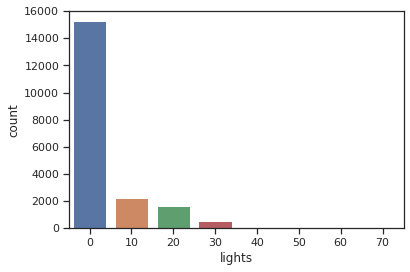

In [132]:
#countplot for lights column

sns.countplot(x=data['lights'])

In [133]:
#Check the distribution of values in lights column
data.lights.value_counts()

0     15252
10     2212
20     1624
30      559
40       77
50        9
70        1
60        1
Name: lights, dtype: int64

In [134]:
#adding a new column in data containg modified values of lights column

def modified_response(row):
  if ((row['lights'] <=7) & (row['lights'] >=0) ):
    val = 0
  elif (row['lights']==8):
    val = 1
  else:
    val = -1
  
  return val

In [135]:
data['Modified_Response'] = data.apply(modified_response,axis = 1)

In [136]:
#getting value counts

data['Modified_Response'].value_counts()

 0    15252
-1     4483
Name: Modified_Response, dtype: int64

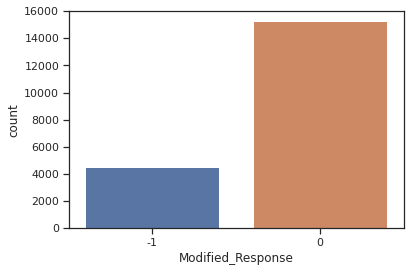

In [137]:
#countplot for Modified_Response(new column)

sns.countplot(x= data['Modified_Response'])


# Observations

1. Temperature columns - Temperature inside the house varies between 14.89 Deg & 29.85 Deg , temperatire outside (T6) varies between -6.06 Deg to 28.29 Deg . The reason for this variation is sensors are kept outside the house

2.   Humidiy columns - Humidity inside house varies is between 20.60% to 63.36% with exception of RH_5 (Bathroom) and RH_6 (Outside house) which varies between 29.82% to 96.32% and 1% to 99.9% respectively.

3.  Appliances - 75% of Appliance consumption is less than 100 Wh . With the maximum consumption of 1080 Wh , there will be outliers in this column and there are small number of cases where consumption is very high

4.  Lights column - Due to lot of zero enteries this column is of not much use . With 11438 0 (zero) enteries in 14801 rows , this column will not add any value to the model . I believed light consumption along with humidity level in a room will give idea about human presence in the room and hence its impact on Appliance consumption. Hence for now , I will dropping this column



# Data Visualization

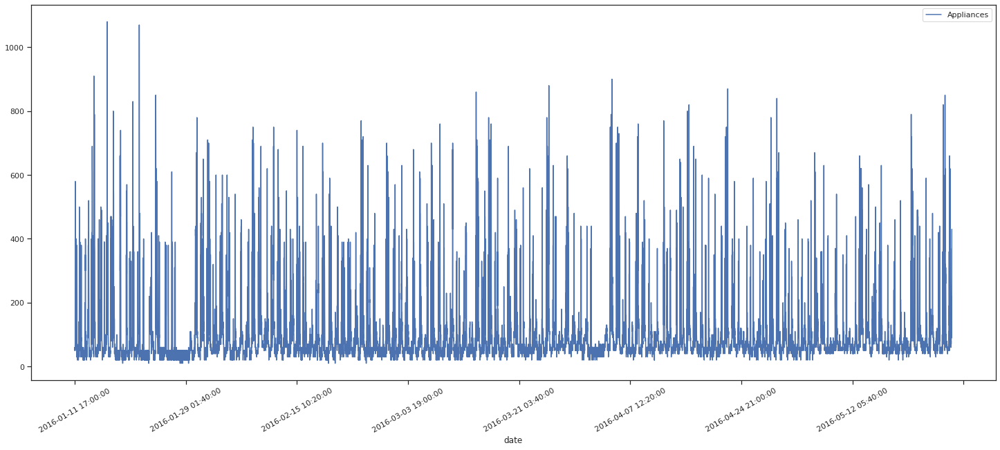

In [138]:
#data visualization

data.plot(x='date', y='Appliances', figsize=(25,10), rot=30)

In [139]:
# Seggregate the columns based on its category.

temp_cols = ["T1","T2","T3","T4","T5","T6","T7","T8","T9"]
humidity_cols = ["RH_1","RH_2","RH_3","RH_4","RH_5","RH_6","RH_7","RH_8","RH_9"]
weather_cols = ["T_out", "Tdewpoint","RH_out","Press_mm_hg","Windspeed","Visibility"] 
light_cols = ["lights"]
random_cols = ["rv1", "rv2"]
target = ["Appliances"]

In [140]:
# Seperate dependent and independent variables 

feature_vars = data[temp_cols + humidity_cols + weather_cols + light_cols + random_cols ]
target_vars = data[target]


In [141]:
#description of feature_vars

feature_vars.describe()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Visibility,lights,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,21.686571,20.341219,22.267611,20.855335,19.592106,7.910939,20.267106,22.029107,19.485828,40.259739,40.420420,39.242500,39.026904,50.949283,54.609083,35.388200,42.936165,41.552401,7.411665,3.760707,79.750418,755.522602,4.039752,38.330834,3.801875,24.988033,24.988033
std,1.606066,2.192974,2.006111,2.042884,1.844623,6.090347,2.109993,1.956162,2.014712,3.979299,4.069813,3.254576,4.341321,9.022034,31.149806,5.114208,5.224361,4.151497,5.317409,4.194648,14.901088,7.399441,2.451221,11.794719,7.935988,14.496634,14.496634
min,16.790000,16.100000,17.200000,15.100000,15.330000,-6.065000,15.390000,16.306667,14.890000,27.023333,20.463333,28.766667,27.660000,29.815000,1.000000,23.200000,29.600000,29.166667,-5.000000,-6.600000,24.000000,729.300000,0.000000,1.000000,0.000000,0.005322,0.005322
25%,20.760000,18.790000,20.790000,19.530000,18.277500,3.626667,18.700000,20.790000,18.000000,37.333333,37.900000,36.900000,35.530000,45.400000,30.025000,31.500000,39.066667,38.500000,3.666667,0.900000,70.333333,750.933333,2.000000,29.000000,0.000000,12.497889,12.497889
50%,21.600000,20.000000,22.100000,20.666667,19.390000,7.300000,20.033333,22.100000,19.390000,39.656667,40.500000,38.530000,38.400000,49.090000,55.290000,34.863333,42.375000,40.900000,6.916667,3.433333,83.666667,756.100000,3.666667,40.000000,0.000000,24.897653,24.897653
75%,22.600000,21.500000,23.290000,22.100000,20.619643,11.256000,21.600000,23.390000,20.600000,43.066667,43.260000,41.760000,42.156667,53.663333,83.226667,39.000000,46.536000,44.338095,10.408333,6.566667,91.666667,760.933333,5.500000,40.000000,0.000000,37.583769,37.583769
max,26.260000,29.856667,29.236000,26.200000,25.795000,28.290000,26.000000,27.230000,24.500000,63.360000,56.026667,50.163333,51.090000,96.321667,99.900000,51.400000,58.780000,53.326667,26.100000,15.500000,100.000000,772.300000,14.000000,66.000000,70.000000,49.996530,49.996530


In [142]:
#description of target_vars

target_vars.describe()

,Appliances
count,19735.000000
mean,97.694958
std,102.524891
min,10.000000
25%,50.000000
50%,60.000000
75%,100.000000
max,1080.000000


# To plot multiple pairwise bivariate distributions

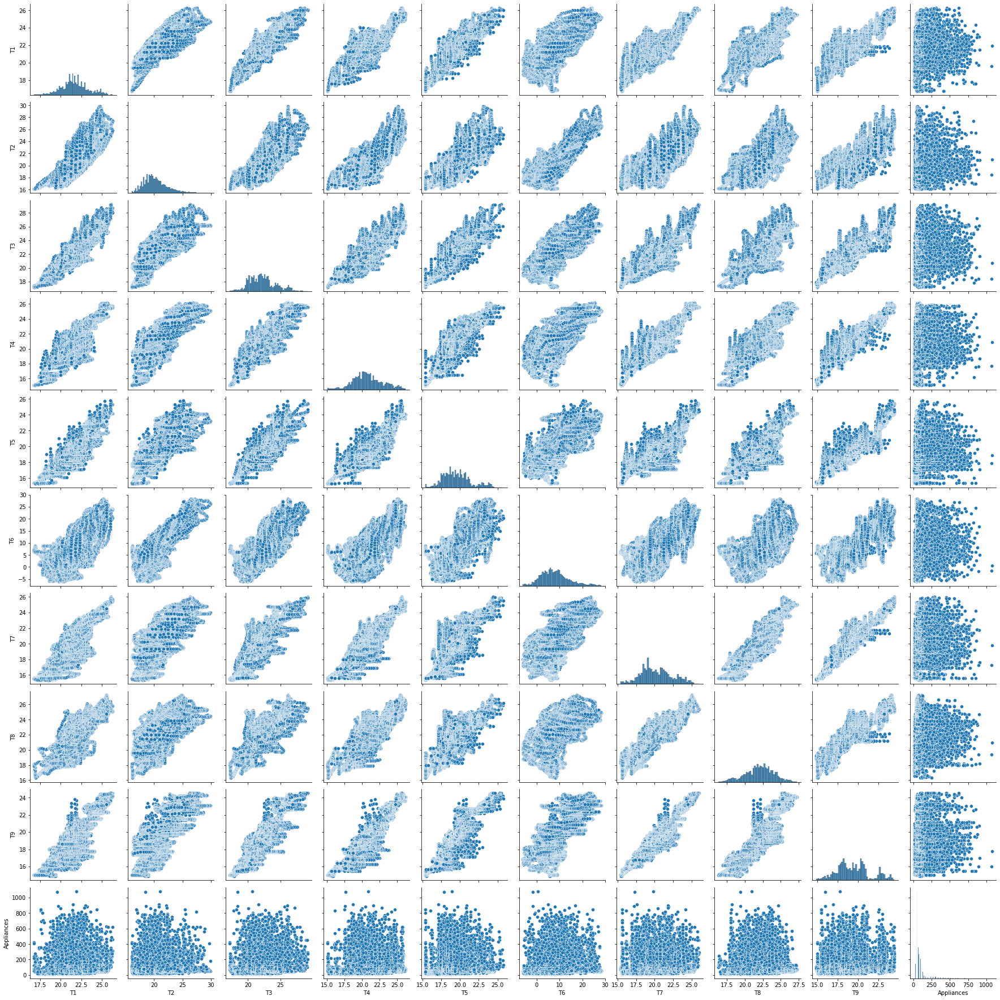

In [ ]:
#data visualization

sns.pairplot(data[temp_cols+target]) 

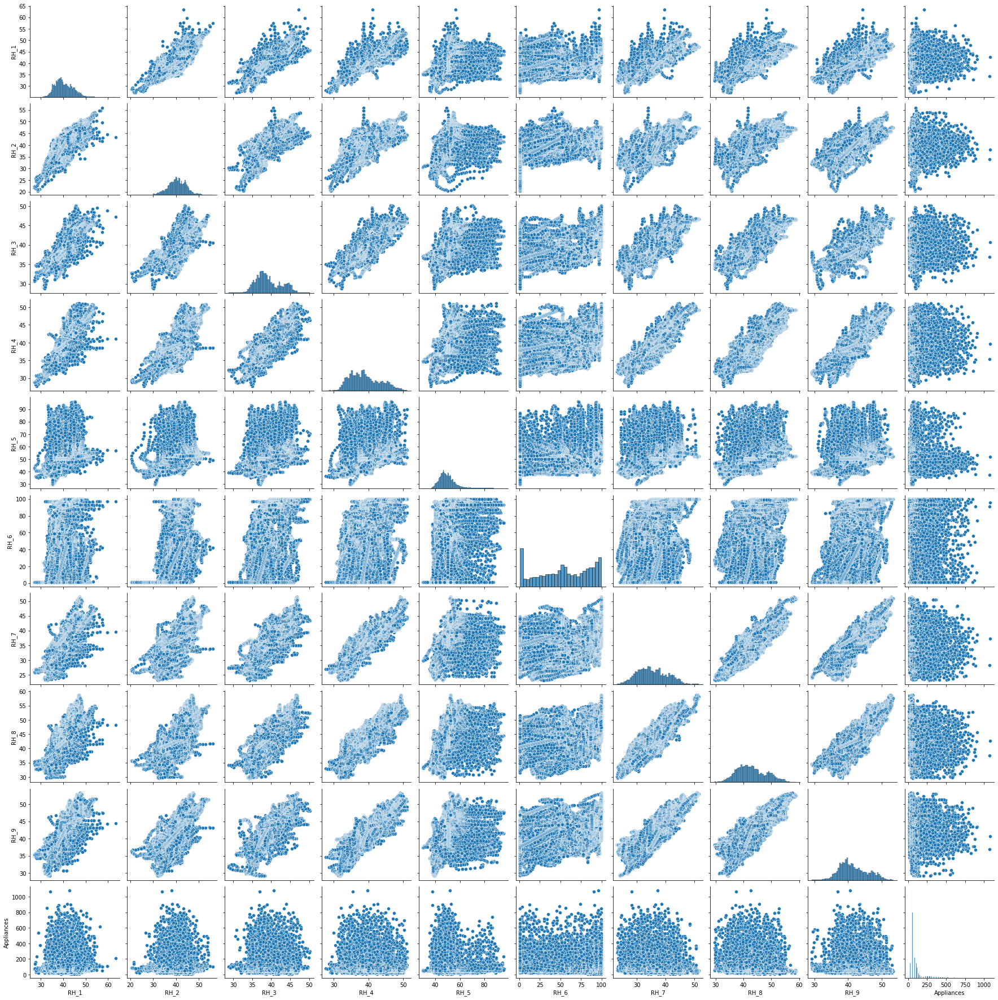

In [ ]:
#data visualization

sns.pairplot(data[humidity_cols+target])

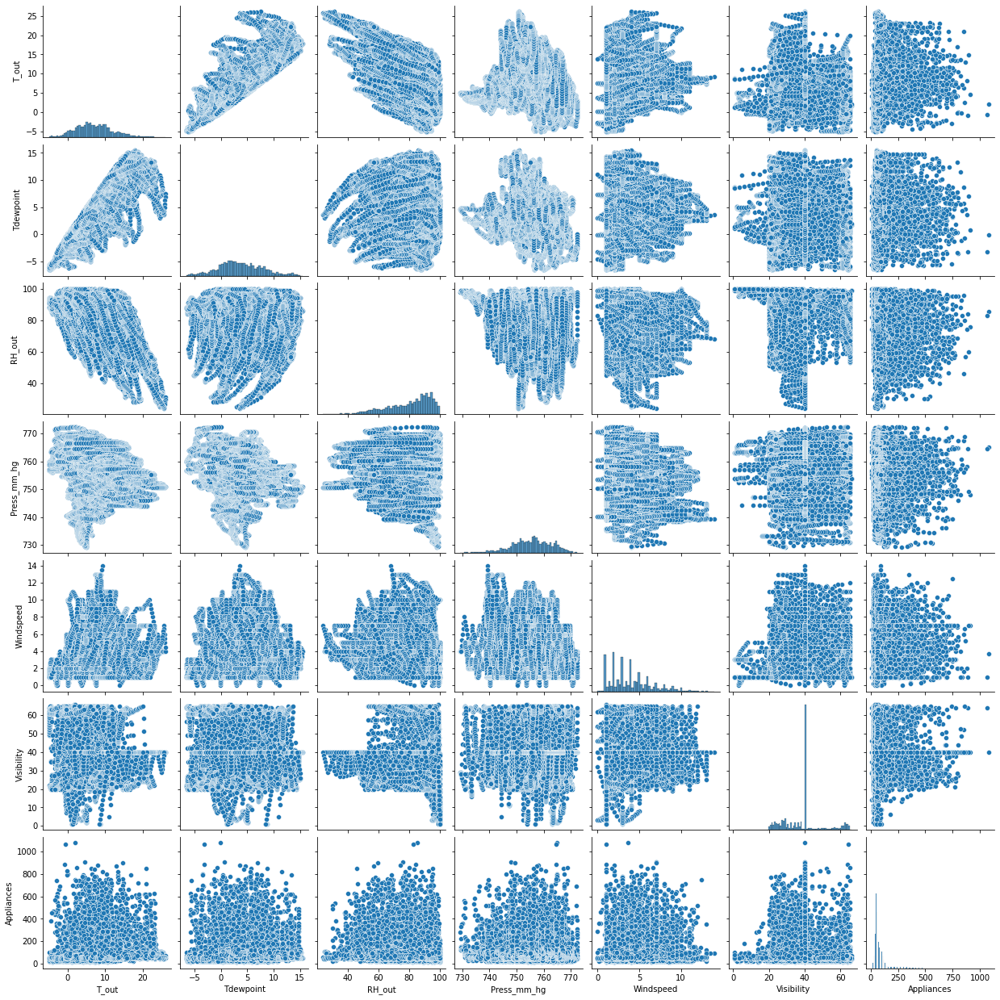

In [ ]:
#data visualization

sns.pairplot(data[weather_cols+target])

# Checking distribution of features

Histograms

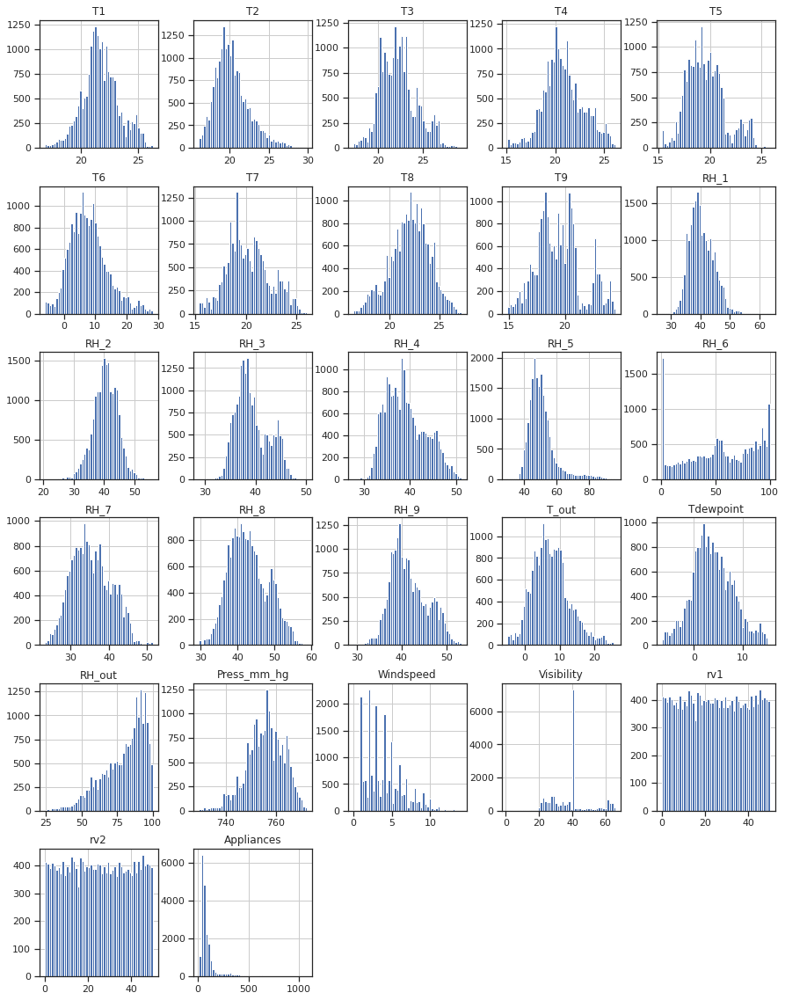

In [148]:
#data visualization

data[temp_cols+ humidity_cols+ weather_cols+ random_cols+ target].hist(bins=50, figsize=(15,20));

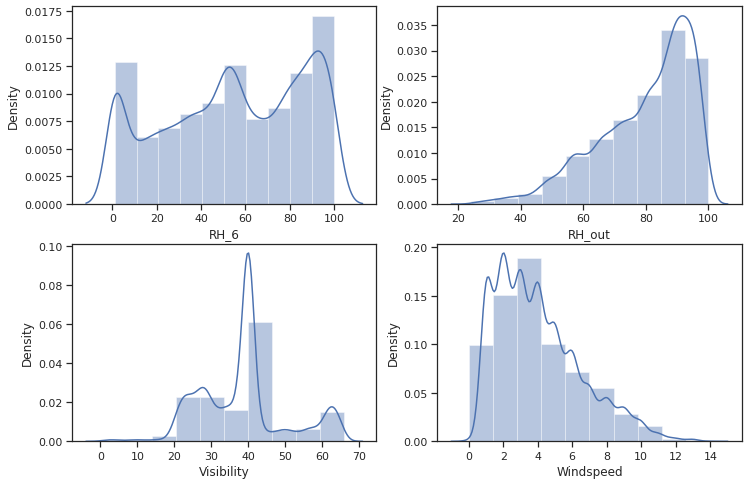

In [149]:
# focussed displots for RH_6 , RH_out , Visibility , Windspeed due to irregular distribution
f, ax = plt.subplots(2,2,figsize=(12,8))
vis1 = sns.distplot(data["RH_6"],bins=10, ax= ax[0][0])
vis2 = sns.distplot(data["RH_out"],bins=10, ax=ax[0][1])
vis3 = sns.distplot(data["Visibility"],bins=10, ax=ax[1][0])
vis4 = sns.distplot(data["Windspeed"],bins=10, ax=ax[1][1])

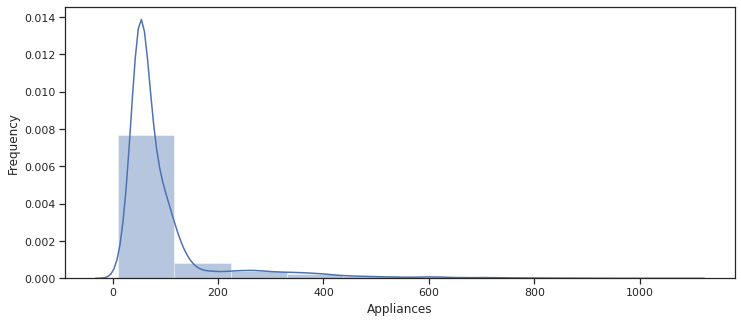

In [150]:
# Distribution of values in Appliances column
f = plt.figure(figsize=(12,5))
plt.xlabel('Appliance consumption in Wh')
plt.ylabel('Frequency')
sns.distplot(data['Appliances'], bins=10 ) ;

In [151]:
#Injesting new features to the dataset

data["exact_date"]=data['date'].str.split(' ').str[0]

data["hours"]=(data['date'].str.split(':').str[0].str.split(" ").str[1]).astype(str).astype(int)
data["seconds"]=((data['date'].str.split(':').str[1])).astype(str).astype(int).mul(60)

data["week"]=(data['date'].str.split(' ').str[0])
data["week"]=(data['week'].apply(dateutil.parser.parse, dayfirst=True))
data["weekday"]=(data['week'].dt.dayofweek).astype(str).astype(int)
data["week"]=(data['week'].dt.day_name())

data['log_appliances'] = np.log(data.Appliances)

data["days"]=(data['date'].str.split(' ').str[0])
data["days"]=(data['days'].apply(dateutil.parser.parse, dayfirst=True))
data["days_num"]=(data['days'].dt.dayofweek).astype(str).astype(int)
data["days"]=(data['days'].dt.day_name())

data.head(5)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,Modified_Response,exact_date,hours,seconds,week,weekday,log_appliances,days,days_num
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,-1,2016-01-11,17,0,Tuesday,1,4.094345,Tuesday,1
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,-1,2016-01-11,17,600,Tuesday,1,4.094345,Tuesday,1
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,-1,2016-01-11,17,1200,Tuesday,1,3.912023,Tuesday,1
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,-1,2016-01-11,17,1800,Tuesday,1,3.912023,Tuesday,1
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,-1,2016-01-11,17,2400,Tuesday,1,4.094345,Tuesday,1


# Q-Q plots

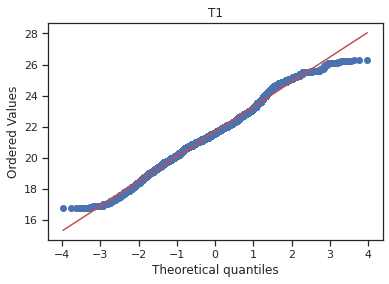

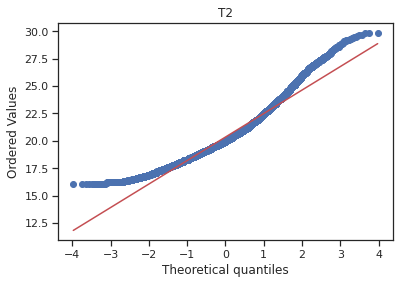

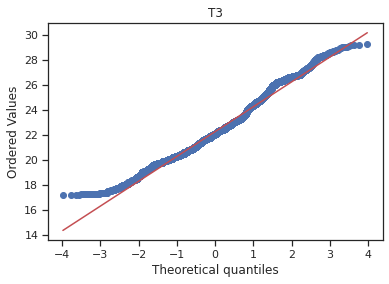

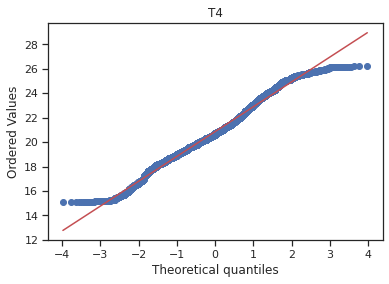

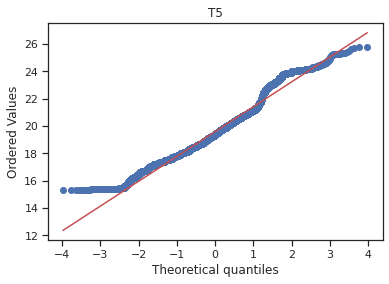

...

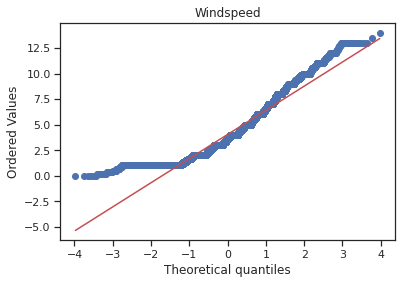

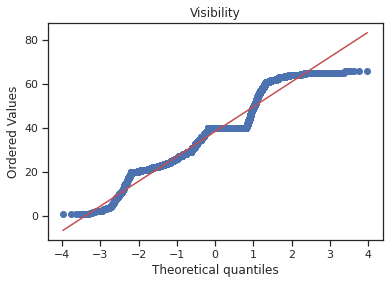

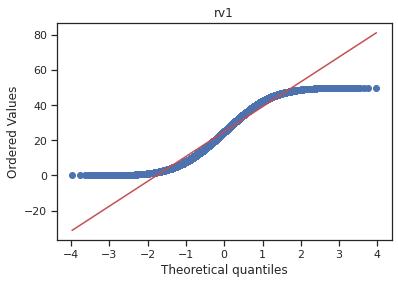

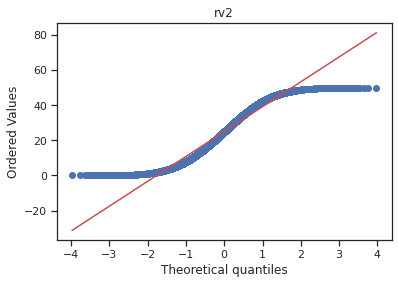

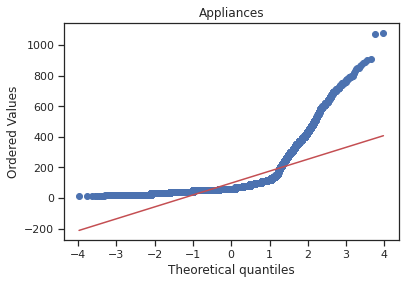

In [146]:
#data visualization q-q plots

for col in data[temp_cols+ humidity_cols+ weather_cols+ random_cols+ target].columns:
    stats.probplot(data[col], dist='norm', plot=plt, fit=True)
    plt.title(col)
    plt.show()


# Observation


Temperature - All the columns follow normal distribution except T9

Humidity - All columns follow normal distribution except RH_6 and RH_out , primarly because these sensors are outside the house

Appliance - This column is postively skewed , most the values are around mean 100 Wh . There are outliers in this column

Visibilty - This column is negatively skewed

Windspeed - This column is postively skewed

Skewed features: Appliances, Visibility, Windspeed, RH_6, RH_out, T9

Randomly distributes features : rv1, rv2, RH_6

Note: Our target variable is skewed. We will apply some transofrmation on it to bring it closer to normal distribution.
Some transformations that can be done to make the feature normal are : Log, Exponential, square root, box-cox, reciprocal



# Feature Engineering

Checking for Outliers and removing extreme 1% of the data.

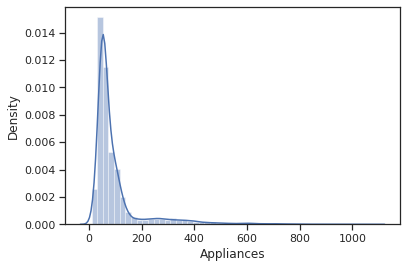

In [152]:
#data visualization of Appliances with distplot

sns.distplot(data["Appliances"])

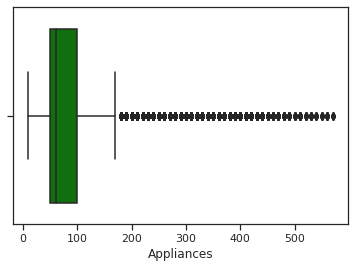

In [153]:
#data visualization of Appliances with box-plot

data = data[data['Appliances'].between(data['Appliances'].quantile(.0), data['Appliances'].quantile(.99))]
sns.boxplot(data["Appliances"],color="green")


# Weekend vs Weekday?

In [ ]:
#getting info

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19537 entries, 0 to 19734
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   date               19537 non-null  object 
 1   Appliances         19537 non-null  int64  
 2   lights             19537 non-null  int64  
 3   T1                 19537 non-null  float64
 4   RH_1               19537 non-null  float64
 5   T2                 19537 non-null  float64
 6   RH_2               19537 non-null  float64
 7   T3                 19537 non-null  float64
 8   RH_3               19537 non-null  float64
 9   T4                 19537 non-null  float64
 10  RH_4               19537 non-null  float64
 11  T5                 19537 non-null  float64
 12  RH_5               19537 non-null  float64
 13  T6                 19537 non-null  float64
 14  RH_6               19537 non-null  float64
 15  T7                 19537 non-null  float64
 16  RH_7               195

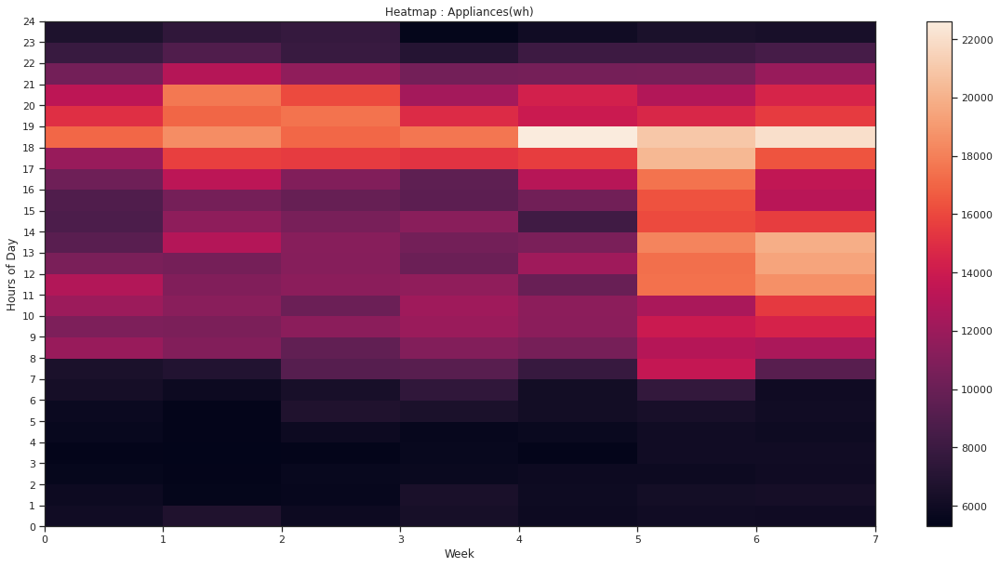

In [154]:
#data visualization

days=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
arranged_day = pd.Categorical(data["week"], categories=days,ordered=True)
day_series = pd.Series(arranged_day)
table = pd.pivot_table(data,index=["hours"],
               values="Appliances",columns=day_series,
               aggfunc=[np.sum],fill_value=0)

fig, ax = plt.subplots(figsize=(20, 10))
ax.set_title('Heatmap : Appliances(wh)')

heatmap = ax.pcolor(table)

ax.set_xlabel("Week Days")
ax.set_ylabel("Hours")

plt.colorbar(heatmap)
ax.set_yticks(range(len(table.index)+1))
ax.set_xticks(range(len(table.columns)+1))

plt.xlabel("Week")
plt.ylabel("Hours of Day")
plt.show()

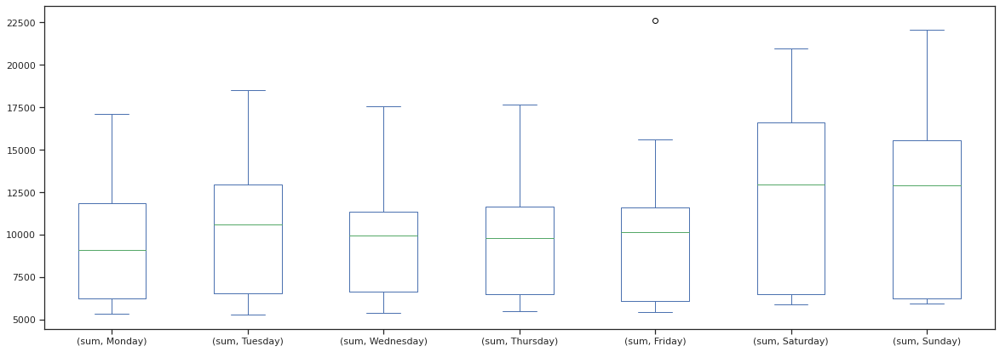

In [155]:
#data visualization

table.plot.box(figsize=(20, 7))

<b>Weekends (Saturdays and Sundays) are observed to have high consumption of Electricity. (> 25% than Weekdays).


In [156]:
# Data sets in 30 minutes and 1 hour basis
data['date'] = pd.to_datetime(data['date'])
data = data.set_index('date')
df_hour = data.resample('1H').mean()
df_30min = data.resample('30min').mean()

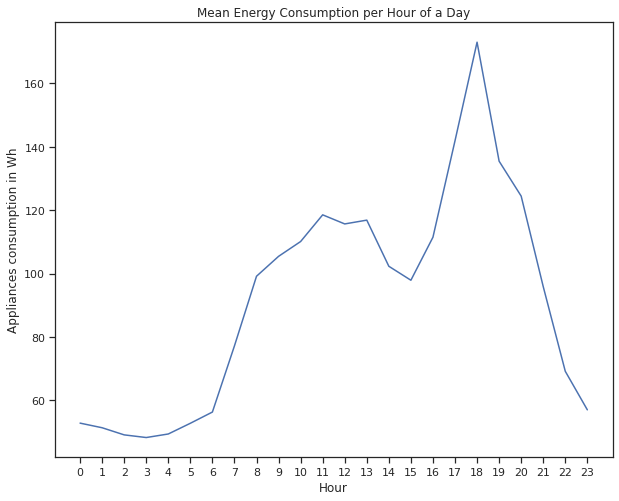

In [157]:
# Plot of Mean Energy Consumption per Hour of a Day

data.groupby('hours')['Appliances'].mean().plot(figsize=(10,8))
plt.xlabel('Hour')
plt.ylabel('Appliances consumption in Wh')
ticks = list(range(0, 24, 1))
plt.title('Mean Energy Consumption per Hour of a Day')

plt.xticks(ticks);


High Electricity consumption of >140Wh is observed during evening hours 16:00 to 20:00. At night hours from 23:00-6:00 the power load is below 50Wh, meaning that most appliances are off or standby. Between 9:00-13:00 the power load is >100Wh and after launch reduces again to <100Wh. At afternoon, the energy consumption ranges from 130-185Wh as family members are at home and many devices are on.

# Histogram of Appliance's consumption

Text(0.5, 0, 'Appliances log(wH)')

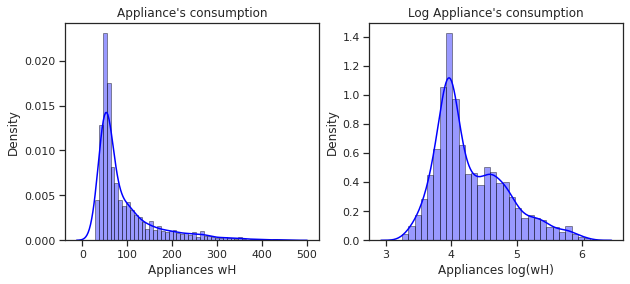

In [158]:
#data visualization

f, axes = plt.subplots(1, 2,figsize=(10,4))

sns.distplot(df_hour.Appliances, hist=True, color = 'blue',hist_kws={'edgecolor':'black'},ax=axes[0])
axes[0].set_title("Appliance's consumption")
axes[0].set_xlabel('Appliances wH')

sns.distplot(df_hour.log_appliances, hist=True, color = 'blue',hist_kws={'edgecolor':'black'},ax=axes[1])
axes[1].set_title("Log Appliance's consumption")
axes[1].set_xlabel('Appliances log(wH)')

The distribution of power load is not normal as we have left asymetry, for this reason we shall use log(power load) which has closer to normal distribution for further analysis.

In [159]:
#Appliance column range with consumption less than 200 Wh

print('Percentage of the appliance consumption is less than 200 Wh')
print(((target_vars[target_vars <= 200].count()) / (len(target_vars)))*100 )


Percentage of the appliance consumption is less than 200 Wh
Appliances    90.291361
dtype: float64


In [160]:
#transform skewed distribution to a normal distribution

target_var_original = data[['Appliances']].copy()

# normality check
def normality(data,feature):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    sns.kdeplot(data[feature])
    plt.subplot(1,2,2)
    stats.probplot(data[feature],plot=plt)
    plt.show()



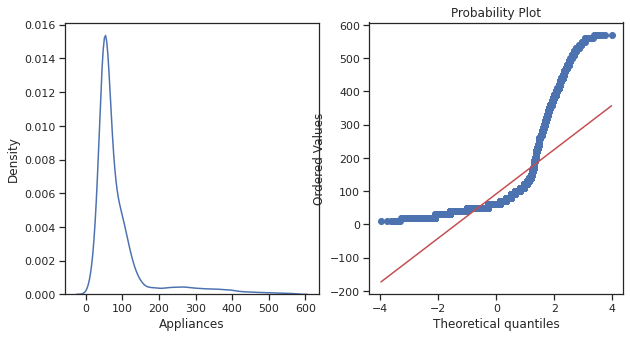

In [161]:
#data visualization

normality(target_var_original,'Appliances')

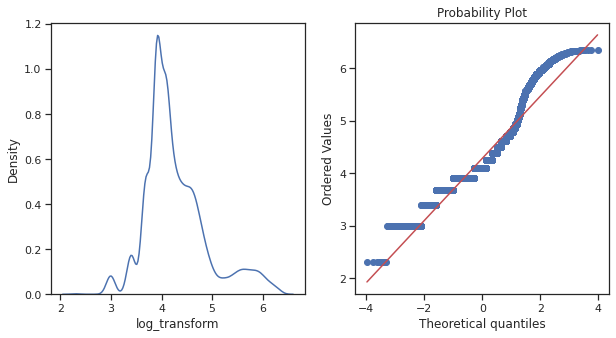

In [162]:
#data visualization

target_var_original['log_transform']=np.log(target_var_original['Appliances'])
normality(target_var_original,'log_transform')



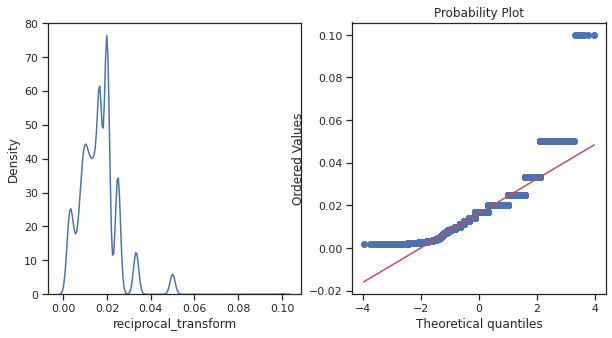

In [163]:
#data visualization

target_var_original['reciprocal_transform']=1/target_var_original.Appliances
normality(target_var_original,'reciprocal_transform')


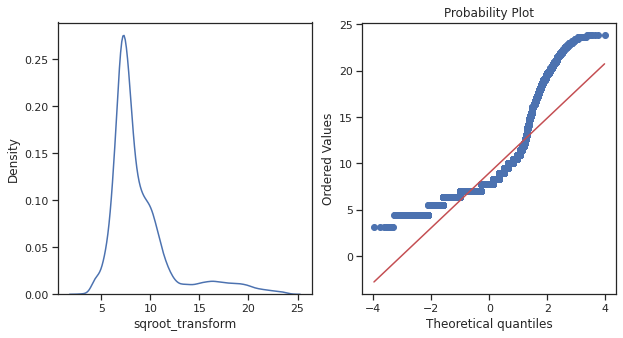

In [164]:
#data visualization

target_var_original['sqroot_transform']= np.sqrt(target_var_original.Appliances)
normality(target_var_original,'sqroot_transform')

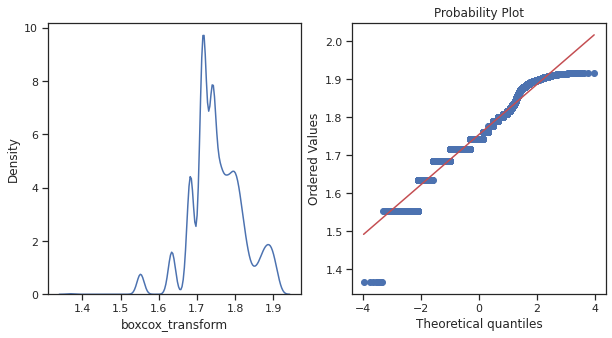

In [165]:
#data visualization

target_var_original['boxcox_transform'], parameters= stats.boxcox(target_var_original['Appliances'])
normality(target_var_original,'boxcox_transform')




Observation:

We observe that none of the transformations are making our target variable perfectly normal, but still log trasnformation is giving better results than others. So we will be applying log transformation on the target variable.


In [166]:
#modifying data

data_log_transformed = data.copy()
data_log_transformed['Appliances'] = np.log(data_log_transformed['Appliances'])


# Correlation Plots

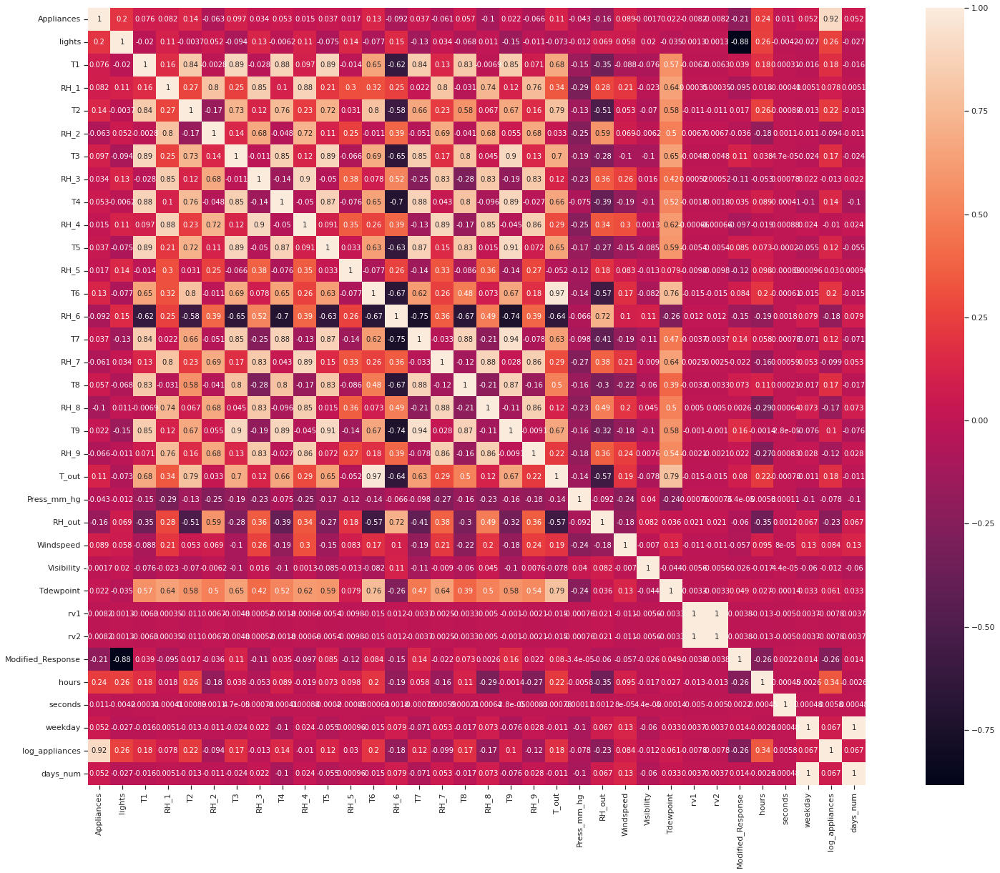

In [167]:
# Checking relationship between variables

# Heatmap without log transformation on target variable
corr_matrix = data.corr()
fig = plt.figure(figsize=(30,20))
sns.heatmap(corr_matrix, annot=True, square=True);

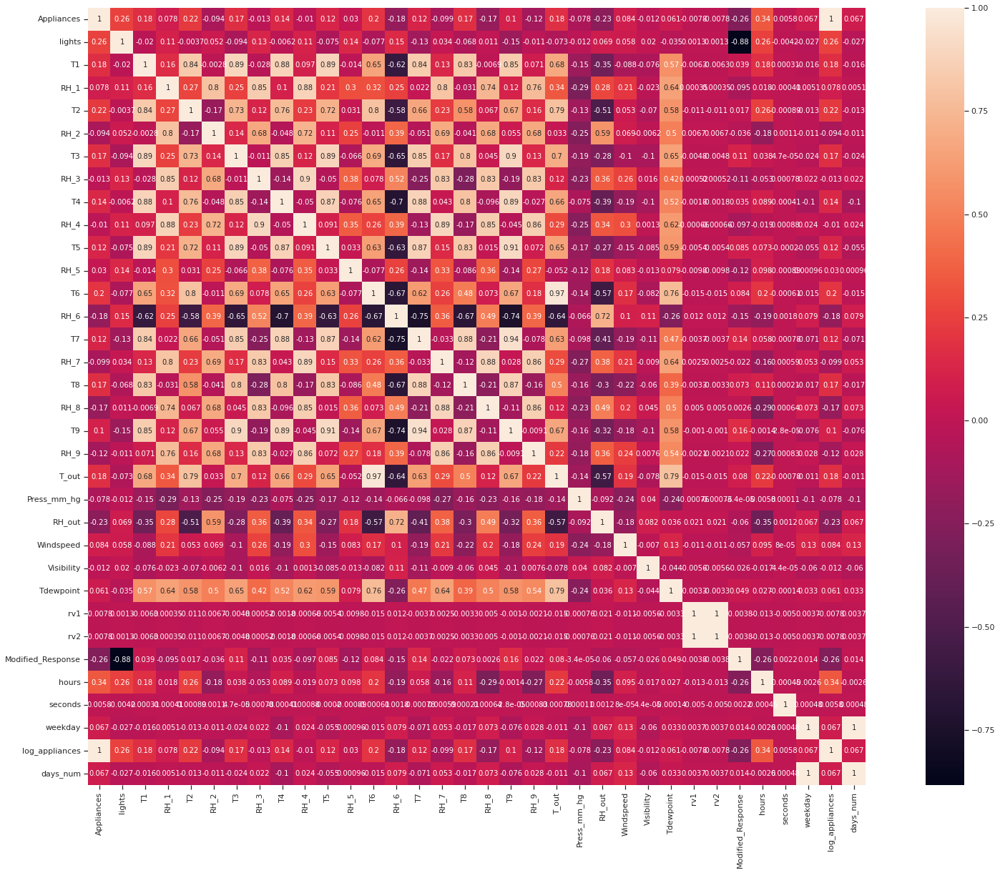

In [168]:
# Heatmap with log transformation on target variable

corr_matrix_transformed = data_log_transformed.corr()
fig = plt.figure(figsize=(30,20))
sns.heatmap(corr_matrix_transformed, annot=True, square=True);

In [169]:
#correlation

corr_matrix = data.corr(method='pearson')
matrix=corr_matrix["Appliances"].sort_values(ascending=False)
print((matrix))

Appliances           1.000000
log_appliances       0.917582
hours                0.240395
lights               0.203749
T2                   0.135168
T6                   0.128404
T_out                0.110673
T3                   0.096963
Windspeed            0.089090
RH_1                 0.081940
T1                   0.075701
T8                   0.057449
T4                   0.052751
weekday              0.051842
days_num             0.051842
T7                   0.037330
T5                   0.037237
RH_3                 0.033819
Tdewpoint            0.021908
T9                   0.021667
RH_5                 0.017001
RH_4                 0.015195
seconds              0.010830
Visibility          -0.001716
rv2                 -0.008237
rv1                 -0.008237
Press_mm_hg         -0.043312
RH_7                -0.060727
RH_2                -0.063190
RH_9                -0.065770
RH_6                -0.092441
RH_8                -0.104898
RH_out              -0.161194
Modified_R

In [170]:
#correlation matrix

corr_matrix_transformed = data_log_transformed.corr()
corr_matrix_transformed

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,Modified_Response,hours,seconds,weekday,log_appliances,days_num
Appliances,1.000000,0.260506,0.175453,0.077892,0.222978,-0.094359,0.174686,-0.012622,0.142838,-0.009960,0.124199,0.029894,0.201324,-0.180850,0.120747,-0.098954,0.168863,-0.171317,0.103486,-0.124939,0.182002,-0.077517,-0.227931,0.084141,-0.012183,0.061443,-0.007817,-0.007817,-0.261936,0.342194,0.005757,0.066888,1.000000,0.066888
lights,0.260506,1.000000,-0.019812,0.105535,-0.003667,0.051585,-0.094422,0.128335,-0.006216,0.113633,-0.074675,0.142388,-0.077392,0.150957,-0.131732,0.034345,-0.067995,0.011220,-0.153642,-0.011157,-0.073003,-0.012258,0.068746,0.058004,0.019762,-0.034565,0.001282,0.001282,-0.884245,0.255033,-0.004160,-0.026504,0.260506,-0.026504
T1,0.175453,-0.019812,1.000000,0.163522,0.836664,-0.002829,0.892734,-0.028248,0.877464,0.096923,0.885522,-0.013626,0.654246,-0.615018,0.838787,0.134326,0.825675,-0.006949,0.845144,0.071002,0.682351,-0.149354,-0.345025,-0.088225,-0.076144,0.571320,-0.006268,-0.006268,0.038873,0.179431,0.000312,-0.016393,0.175453,-0.016393
RH_1,0.077892,0.105535,0.163522,1.000000,0.267917,0.799312,0.252501,0.845953,0.104825,0.881847,0.205234,0.304599,0.315258,0.247739,0.021517,0.802325,-0.030609,0.737040,0.115155,0.764684,0.339985,-0.293826,0.275614,0.205772,-0.022719,0.639679,0.000348,0.000348,-0.095311,0.017775,-0.000413,0.005083,0.077892,0.005083
T2,0.222978,-0.003667,0.836664,0.267917,1.000000,-0.166897,0.734214,0.120966,0.761612,0.230144,0.720072,0.030731,0.801145,-0.580181,0.663058,0.227748,0.577910,0.067004,0.674987,0.155760,0.792147,-0.131915,-0.506417,0.052754,-0.070325,0.581829,-0.010563,-0.010563,0.016836,0.255735,-0.000888,-0.013161,0.222978,-0.013161
RH_2,-0.094359,0.051585,-0.002829,0.799312,-0.166897,1.000000,0.137887,0.679011,-0.047621,0.721723,0.109763,0.249496,-0.010554,0.391071,-0.050665,0.690486,-0.041208,0.679521,0.054734,0.676625,0.032872,-0.254867,0.585519,0.069267,-0.006169,0.499074,0.006677,0.006677,-0.036330,-0.182994,0.001058,-0.010550,-0.094359,-0.010550
T3,0.174686,-0.094422,0.892734,0.252501,0.734214,0.137887,1.000000,-0.010955,0.853288,0.121877,0.889045,-0.065511,0.685082,-0.646441,0.847851,0.172450,0.795760,0.044602,0.902200,0.133957,0.697986,-0.189180,-0.279379,-0.102968,-0.102443,0.646090,-0.004770,-0.004770,0.109824,0.037581,0.000047,-0.023692,0.174686,-0.023692
RH_3,-0.012622,0.128335,-0.028248,0.845953,0.120966,0.679011,-0.010955,1.000000,-0.141093,0.899687,-0.049823,0.375004,0.077653,0.515697,-0.248832,0.833211,-0.282612,0.829052,-0.194310,0.834390,0.119057,-0.232928,0.355585,0.263840,0.016409,0.415212,0.000516,0.000516,-0.108582,-0.053443,0.000778,0.022328,-0.012622,0.022328
T4,0.142838,-0.006216,0.877464,0.104825,0.761612,-0.047621,0.853288,-0.141093,1.000000,-0.049906,0.872504,-0.075868,0.651351,-0.703250,0.878158,0.042661,0.796564,-0.096492,0.889747,-0.026956,0.662477,-0.074966,-0.388016,-0.186819,-0.104879,0.518976,-0.001807,-0.001807,0.034937,0.089304,-0.000409,-0.100475,0.142838,-0.100475
RH_4,-0.009960,0.113633,0.096923,0.881847,0.230144,0.721723,0.121877,0.899687,-0.049906,1.000000,0.090625,0.353231,0.258479,0.393963,-0.131354,0.893881,-0.167817,0.846694,-0.044985,0.856281,0.292751,-0.250137,0.336285,0.300871,0.001301,0.615898,-0.000660,-0.000660,-0.096933,-0.018871,0.000875,0.023768,-0.009960,0.023768



Observation:

From the above two heatmaps, we observe that after log trasnformation, our target variable is having better relationship with other variables. That's a good thing for us.


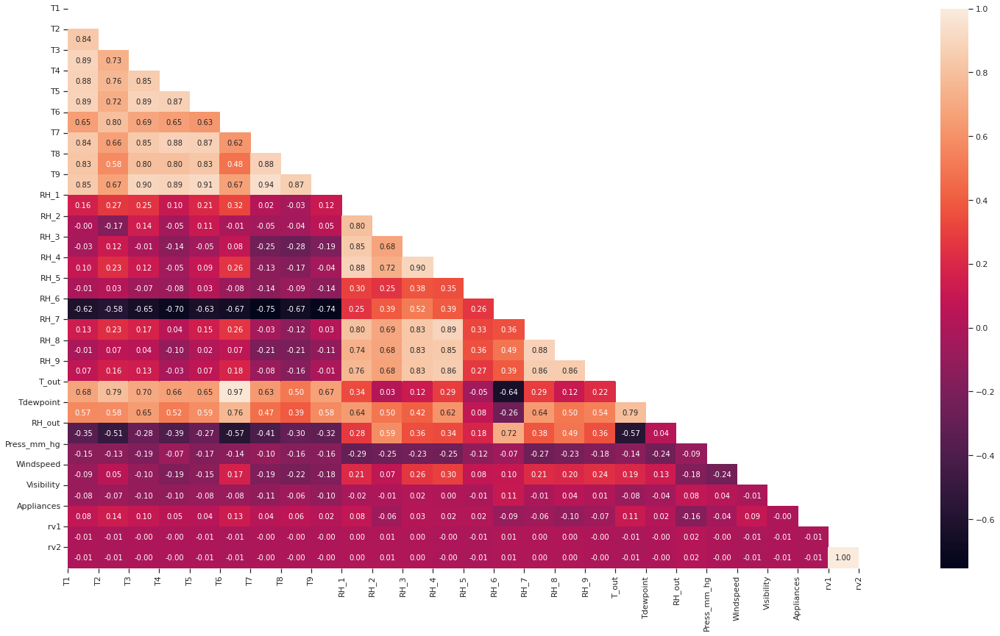

In [171]:
# Use the weather , temperature , applainces and random column to see the correlation
df_corr = data[temp_cols + humidity_cols + weather_cols + target + random_cols]
corr = df_corr.corr()
# Mask the repeated values
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
  
f, ax = plt.subplots(figsize=(25, 14))
#Generate Heat Map, allow annotations and place floats in map
sns.heatmap(corr, annot=True, fmt=".2f" , mask=mask,)
    #Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns);
    #Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns)
    #show plot
plt.show()



# Multi collinearity check

In [172]:
def top_correlation (df,n):
    corr_matrix = df.corr()
    correlation = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
    correlation = pd.DataFrame(correlation).reset_index()
    correlation.columns=["Variable_1","Variable_2","Correlation"]
    correlation = correlation.reindex(correlation.Correlation.abs().sort_values(ascending=False).index).reset_index().drop(["index"],axis=1)
    return correlation.head(n)


print("Top Absolute Correlations\n")
top_correlation(data,41)


Top Absolute Correlations



,Variable_1,Variable_2,Correlation
0,weekday,days_num,1.000000
1,rv1,rv2,1.000000
2,T6,T_out,0.974746
3,T7,T9,0.944928
4,Appliances,log_appliances,0.917582
5,T5,T9,0.911125
6,T3,T9,0.902200
7,RH_3,RH_4,0.899687
8,RH_4,RH_7,0.893881
9,T1,T3,0.892734



# Observations based on correlation plot

* Temperature - All the temperature variables from T1-T9 and T_out have positive correlation with the target Appliances . For the indoor temperatures, the correlations are high as expected, since the ventilation is driven by the HRV unit and minimizes air temperature differences between rooms. Four columns have a high degree of correlation with T9 - T3,T5,T7,T8 also T6 & T_Out has high correlation (both temperatures from outside) . Hence T6 & T9 can be removed from training set as information provided by them can be provided by other fields.

* Weather attributes - Visibility, Tdewpoint, Press_mm_hg have low correlation values

* Humidity - There are no significantly high correlation cases (> 0.9) for humidity sensors.

* Random variables have no role to play



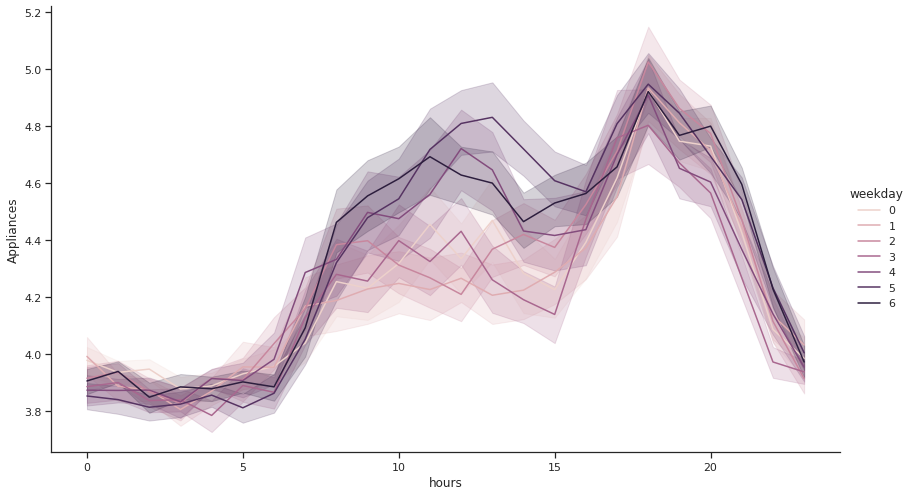

In [173]:
#data visualization

sns.relplot(y='Appliances', x='hours', data=data_log_transformed, kind='line', hue='weekday', height=7, aspect=1.7)
plt.show()

# Linear dependencey evaluation

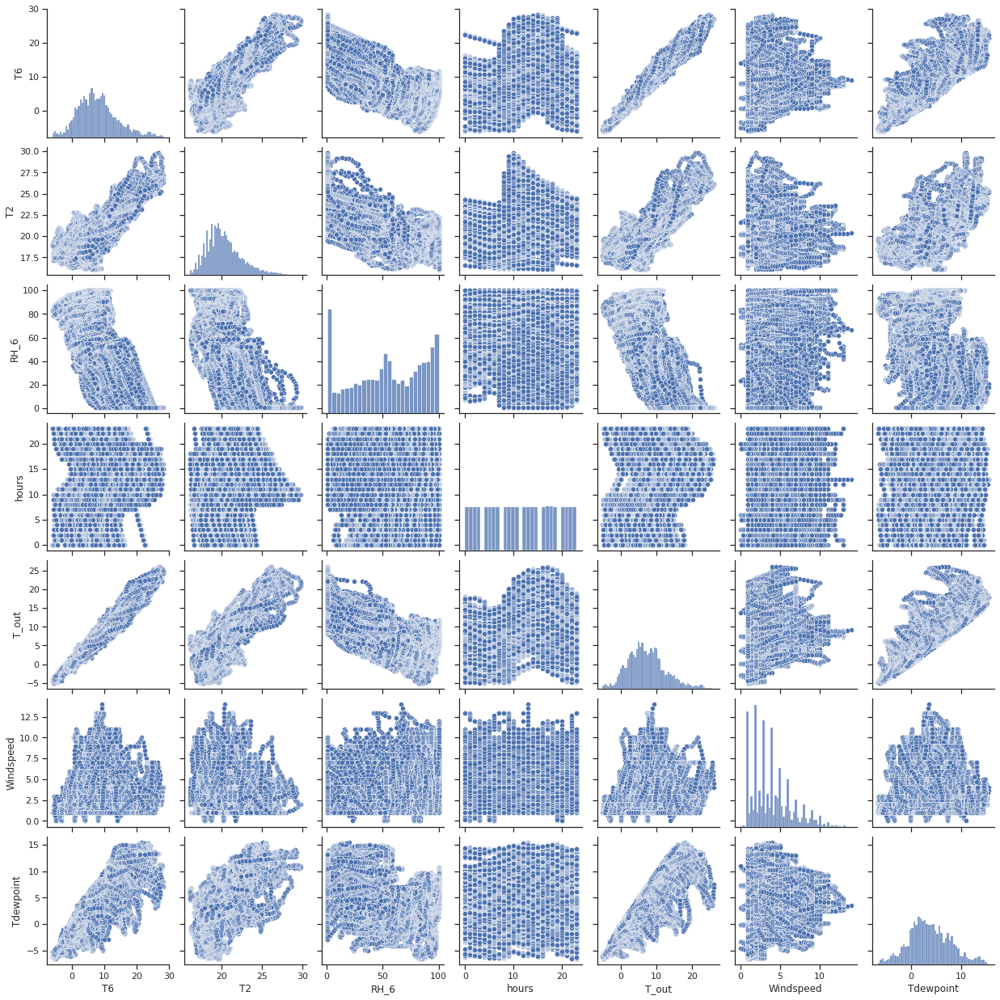

In [42]:
col = ['T6','T2', 'RH_6','hours','T_out','Windspeed','Tdewpoint']
sns.set(style="ticks", color_codes=True)
sns.pairplot(data[col])
plt.show();


<b>Inside temperatures, outside temperatures and tdewpoint have linear relationship. These features will best suite for Linear regression modelling.


# Data Pre Processing


In [174]:
#getting columns

data.columns

Index(['Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4',
       'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9',
       'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility',
       'Tdewpoint', 'rv1', 'rv2', 'Modified_Response', 'exact_date', 'hours',
       'seconds', 'week', 'weekday', 'log_appliances', 'days', 'days_num'],
      dtype='object')

In [175]:
from sklearn.model_selection import train_test_split

# 75% of the data is usedfor the training of the models and the rest is used for testing
train, test = train_test_split(data,test_size=0.25,random_state=40)


In [176]:
#getting description

train.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,Modified_Response,hours,seconds,weekday,log_appliances,days_num
count,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000,14652.000000
mean,91.253754,3.770816,21.701070,40.254595,20.353763,40.426698,22.275903,39.240842,20.870116,39.034092,19.607513,50.954688,7.942953,54.448447,20.282900,35.395266,22.040479,42.940270,19.502662,41.562139,7.441494,755.563214,79.718844,4.042945,38.358563,3.782278,25.067417,25.067417,-0.226522,11.472427,1500.778051,3.063746,4.278752,3.063746
std,83.289671,7.862733,1.603972,3.976258,2.183575,4.080817,2.000334,3.262953,2.046101,4.357394,1.844504,9.065664,6.077431,31.184387,2.109473,5.135884,1.955201,5.258615,2.017280,4.172897,5.300797,7.378509,14.944545,2.455817,11.804142,4.187488,14.506582,14.506582,0.418595,6.953132,1026.478704,2.002293,0.615683,2.002293
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,28.135714,15.330000,29.815000,-6.030000,1.000000,15.390000,23.230000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.333333,24.000000,0.000000,1.000000,-6.516667,0.006033,0.006033,-1.000000,0.000000,0.000000,0.000000,2.302585,0.000000
25%,50.000000,0.000000,20.790000,37.350893,18.823333,37.890000,20.790000,36.900000,19.599167,35.500000,18.290000,45.400000,3.663333,29.767262,18.725000,31.468571,20.790000,39.012000,18.066667,38.500000,3.700000,750.983333,70.333333,2.000000,29.000000,0.933333,12.570662,12.570662,0.000000,5.000000,600.000000,1.000000,3.912023,1.000000
50%,60.000000,0.000000,21.600000,39.626667,20.000000,40.500000,22.100000,38.530000,20.700000,38.400000,19.390000,49.090000,7.366667,55.161667,20.072222,34.858611,22.133333,42.363333,19.390000,40.863333,7.000000,756.133333,83.666667,3.666667,40.000000,3.466667,24.983813,24.983813,0.000000,11.000000,1800.000000,3.000000,4.094345,3.000000
75%,100.000000,0.000000,22.637500,43.090000,21.533333,43.290000,23.316250,41.790000,22.125000,42.200000,20.633333,53.711667,11.233333,83.102857,21.633333,39.030000,23.390000,46.584286,20.600000,44.354643,10.433333,760.933333,91.666667,5.500000,40.000000,6.600000,37.720478,37.720478,0.000000,17.000000,2400.000000,5.000000,4.605170,5.000000
max,570.000000,50.000000,26.260000,57.663333,29.790000,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,95.953889,28.290000,99.900000,26.000000,51.400000,27.133333,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,13.500000,66.000000,15.400000,49.996530,49.996530,0.000000,23.000000,3000.000000,6.000000,6.345636,6.000000


In [177]:
#Split training dataset into independent and dependent varibales
train_X = train[feature_vars.columns]
train_y = train[target_vars.columns]

In [178]:
#Split testing dataset into independent and dependent varibales
test_X = test[feature_vars.columns]
test_y = test[target_vars.columns]


In [179]:
# Due to conlusion made above below columns are removed
train_X.drop(["rv1","rv2","Visibility","T6","T9","lights"],axis=1 , inplace=True)

In [180]:
# Due to conlusion made above below columns are removed
test_X.drop(["rv1","rv2","Visibility","T6","T9","lights"], axis=1, inplace=True)


In [181]:
#getting columns

train_X.columns

Index(['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T8', 'RH_1', 'RH_2', 'RH_3',
       'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'Tdewpoint',
       'RH_out', 'Press_mm_hg', 'Windspeed'],
      dtype='object')

In [182]:
#getting columns

test_X.columns

Index(['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T8', 'RH_1', 'RH_2', 'RH_3',
       'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'Tdewpoint',
       'RH_out', 'Press_mm_hg', 'Windspeed'],
      dtype='object')

In [183]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

# Create test and training set by including Appliances column

train = train[list(train_X.columns.values) + target ]

test = test[list(test_X.columns.values) + target ]

# Create dummy test and training set to hold scaled values

sc_train = pd.DataFrame(columns=train.columns , index=train.index)

sc_train[sc_train.columns] = sc.fit_transform(train)

sc_test= pd.DataFrame(columns=test.columns , index=test.index)

sc_test[sc_test.columns] = sc.fit_transform(test)

In [184]:
#first five rows

sc_train.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Appliances
date,,,,,,,,,,,,,,,,,,,,,,
2016-03-30 13:20:00,-0.000667,0.387560,0.162027,0.190556,0.267012,0.287807,1.002244,0.354300,-0.024513,-0.034993,0.510852,-0.388441,-1.229881,-0.312569,-0.313833,-0.440669,0.514124,-0.091294,-1.096458,-0.293188,0.796933,0.105014
2016-01-17 02:50:00,-0.000667,0.199788,-0.459557,-0.283532,-0.660098,-0.323741,-0.532178,-0.107625,-0.423140,1.026454,0.632489,0.316808,1.338586,1.032912,1.050958,0.711248,-1.309564,-0.883363,1.167544,1.218009,-0.085356,-0.735455
2016-01-29 10:10:00,-2.307519,-1.490159,-1.587741,-1.945286,-1.576365,-1.508912,-2.475778,0.807840,0.924675,0.845630,1.091494,-0.052608,0.992354,0.719421,0.467768,0.414082,-0.262515,-0.162938,0.130341,1.136689,1.950696,-0.615388
2016-02-04 09:50:00,-0.526463,-0.227660,-0.442893,-0.115728,-0.546243,-0.970844,-0.625380,1.368688,0.508078,0.990358,0.581233,0.387223,1.337517,0.409824,0.464493,1.146212,-0.570656,0.004232,1.078322,0.852069,1.475617,-0.135120
2016-04-21 07:10:00,-0.125362,-0.716173,0.162027,0.530727,0.212795,0.477434,-0.111064,-0.826918,-0.082510,-1.013689,-1.188387,-0.436242,-0.666653,-0.374600,-0.522387,-0.751815,-0.564367,-0.572903,0.063425,1.028263,-0.764040,-0.735455


In [185]:
#first five rows

sc_test.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Appliances
date,,,,,,,,,,,,,,,,,,,,,,
2016-01-12 01:10:00,-0.403099,0.046500,-1.061017,0.220525,-0.303800,-1.157311,-1.383895,1.308524,0.933689,1.980913,1.978933,-0.098763,1.164481,2.020862,1.870751,1.143481,-0.404130,0.051145,0.808580,-2.383571,0.750173,3.163487
2016-02-29 12:10:00,-1.313305,-0.581705,-0.915520,-0.748451,-1.336236,-0.221336,-0.904713,-1.758009,-2.168314,-1.753124,-1.602668,-0.157480,-0.692411,-1.535116,-1.606538,-0.403345,-0.497358,-1.709153,-1.621593,0.998984,1.228523,0.188157
2016-04-04 22:10:00,0.815336,0.227278,1.177395,0.449675,1.266589,0.700385,1.119066,1.230218,1.610190,0.365268,1.176536,3.951622,-0.358906,0.961818,0.537202,0.750468,0.478429,1.117632,0.740761,-0.834258,-0.889884,-0.155150
2016-02-04 12:40:00,-0.533424,-0.162902,-0.065062,-0.137930,-0.536249,-0.994188,-0.837310,1.635216,0.620189,1.800359,0.833319,0.204175,1.399514,0.724929,0.400319,0.850552,-0.009465,0.665664,1.034643,0.795538,0.681837,1.675822
2016-02-24 12:50:00,-0.713396,-0.310537,-0.762562,-0.257416,-0.792849,-0.444640,-1.004967,-0.191063,-0.296387,0.331026,-0.397127,-0.086421,1.057569,-0.335660,-0.697033,-0.464697,-0.205243,-1.122387,-1.305106,0.428890,-0.821548,-0.498457


In [186]:
# Remove Appliances column from traininig set

train_X =  sc_train.drop(['Appliances'] , axis=1)
train_y = sc_train['Appliances']

test_X =  sc_test.drop(['Appliances'] , axis=1)
test_y = sc_test['Appliances']


In [187]:
#first five rows

train_X.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed
date,,,,,,,,,,,,,,,,,,,,,
2016-03-30 13:20:00,-0.000667,0.387560,0.162027,0.190556,0.267012,0.287807,1.002244,0.354300,-0.024513,-0.034993,0.510852,-0.388441,-1.229881,-0.312569,-0.313833,-0.440669,0.514124,-0.091294,-1.096458,-0.293188,0.796933
2016-01-17 02:50:00,-0.000667,0.199788,-0.459557,-0.283532,-0.660098,-0.323741,-0.532178,-0.107625,-0.423140,1.026454,0.632489,0.316808,1.338586,1.032912,1.050958,0.711248,-1.309564,-0.883363,1.167544,1.218009,-0.085356
2016-01-29 10:10:00,-2.307519,-1.490159,-1.587741,-1.945286,-1.576365,-1.508912,-2.475778,0.807840,0.924675,0.845630,1.091494,-0.052608,0.992354,0.719421,0.467768,0.414082,-0.262515,-0.162938,0.130341,1.136689,1.950696
2016-02-04 09:50:00,-0.526463,-0.227660,-0.442893,-0.115728,-0.546243,-0.970844,-0.625380,1.368688,0.508078,0.990358,0.581233,0.387223,1.337517,0.409824,0.464493,1.146212,-0.570656,0.004232,1.078322,0.852069,1.475617
2016-04-21 07:10:00,-0.125362,-0.716173,0.162027,0.530727,0.212795,0.477434,-0.111064,-0.826918,-0.082510,-1.013689,-1.188387,-0.436242,-0.666653,-0.374600,-0.522387,-0.751815,-0.564367,-0.572903,0.063425,1.028263,-0.764040


In [188]:
#first five rows

train_y.head()

date
2016-03-30 13:20:00    0.105014
2016-01-17 02:50:00   -0.735455
2016-01-29 10:10:00   -0.615388
2016-02-04 09:50:00   -0.135120
2016-04-21 07:10:00   -0.735455
Name: Appliances, dtype: float64

In [210]:
#importing some libraries again in case they got missed

from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.neural_network import MLPRegressor
import xgboost as xgb
from sklearn import neighbors
from sklearn.svm import SVR

# Model Implementation

We will be looking at following Algorithms

1. Linear Regression


Improved Linear regression models(Regularization)

2. Ridge regression

3. Lasso regression

4. ElasticNet Regression


Support Vector Machine

5. Support vector regression


Nearest neighbour Regressor

6. KNeighborsRegressor


Ensemble models

7. Random Forest Regressor

8. Gradient Boosting Regressor

9. ExtraTrees Regressor

10. DecisionTree Regression 


Neural Network

11. Multi Layer Preceptron Regressor

In [190]:
models = [
           ['Linear:', LinearRegression()],
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['ElasticNet', ElasticNet()],
           ['KNeighborsRegressor:',  neighbors.KNeighborsRegressor()],
           ['DecisionTreeRegressor:', DecisionTreeRegressor()],
           ['SVR:' , SVR(kernel='rbf')],
           ['RandomForest ',RandomForestRegressor()],
           ['ExtraTreeRegressor :',ExtraTreesRegressor()],
           ['GradientBoostingClassifier: ', GradientBoostingRegressor()] ,
           ['XGBRegressor: ', xgb.XGBRegressor()] ,
           ['MLPRegressor: ', MLPRegressor(  activation='relu', solver='adam',learning_rate='adaptive',max_iter=1000,learning_rate_init=0.01,alpha=0.01)]]

In [191]:
# Run all the proposed models and update the information in a list model_data
import time
from math import sqrt
import sklearn.metrics as metrics
from sklearn.metrics import mean_absolute_error

model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model.random_state = 78
    curr_model_data["Name"] = name
    start = time.time()
    curr_model.fit(train_X,train_y)
    y_pred = curr_model.predict(test_X)
    end = time.time()

    MSE = mean_squared_error((test_y), (y_pred))
    RMSE = np.sqrt(MSE)
    Adjusted_R2_score = 1-(1-r2_score (10** (test_y), 10**(y_pred)))*((test_X.shape[0]-1)/(test_X.shape[0]-test_X.shape[1]-1))

    curr_model_data["Mean Squared Error"] = MSE
    curr_model_data["Train_Time"] = end - start
    curr_model_data["Train_R2_Score"] = metrics.r2_score(train_y,curr_model.predict(train_X))
    curr_model_data["Test_R2_Score"] = metrics.r2_score(test_y,curr_model.predict(test_X))
    curr_model_data["Adjusted R2 score"] = Adjusted_R2_score
    curr_model_data["Test_RMSE_Score"] = sqrt(mean_squared_error(test_y,curr_model.predict(test_X)))
    curr_model_data["RMSE"] = RMSE
    model_data.append(curr_model_data)



[14:30:04] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [192]:
model_data

[{'Name': 'Linear:',
  'Mean Squared Error': 0.8587583769682897,
  'Train_Time': 0.013214349746704102,
  'Train_R2_Score': 0.1420058017643827,
  'Test_R2_Score': 0.14124162303171017,
  'Adjusted R2 score': -0.012418471963983713,
  'Test_RMSE_Score': 0.9266921694760832,
  'RMSE': 0.9266921694760832},
 {'Name': 'Lasso: ',
  'Mean Squared Error': 0.9999999999999998,
  'Train_Time': 0.008285045623779297,
  'Train_R2_Score': 0.0,
  'Test_R2_Score': 0.0,
  'Adjusted R2 score': -0.012463009277521975,
  'Test_RMSE_Score': 0.9999999999999999,
  'RMSE': 0.9999999999999999},
 {'Name': 'Ridge: ',
  'Mean Squared Error': 0.8587415483841166,
  'Train_Time': 0.009409189224243164,
  'Train_R2_Score': 0.14200557492277976,
  'Test_R2_Score': 0.14125845161588324,
  'Adjusted R2 score': -0.012418181772271497,
  'Test_RMSE_Score': 0.9266830895101715,
  'RMSE': 0.9266830895101715},
 {'Name': 'ElasticNet',
  'Mean Squared Error': 0.9999999999999998,
  'Train_Time': 0.008185386657714844,
  'Train_R2_Score': 0

In [193]:
# Convert list to dataframe
df = pd.DataFrame(model_data)


In [194]:
df

,Name,Mean Squared Error,Train_Time,Train_R2_Score,Test_R2_Score,Adjusted R2 score,Test_RMSE_Score,RMSE
0,Linear:,0.858758,0.013214,0.142006,0.141242,-0.012418,0.926692,0.926692
1,Lasso:,1.000000,0.008285,0.000000,0.000000,-0.012463,1.000000,1.000000
2,Ridge:,0.858742,0.009409,0.142006,0.141258,-0.012418,0.926683,0.926683
3,ElasticNet,1.000000,0.008185,0.000000,0.000000,-0.012463,1.000000,1.000000
4,KNeighborsRegressor:,0.526855,1.343233,0.673236,0.473145,-0.005396,0.725848,0.725848
5,DecisionTreeRegressor:,0.954520,0.466909,1.000000,0.045480,-4.036266,0.976995,0.976995
6,SVR:,0.757906,15.120693,0.262208,0.242094,-0.012372,0.870578,0.870578
7,RandomForest,0.479912,29.756995,0.936494,0.520088,-0.006307,0.692757,0.692757
8,ExtraTreeRegressor :,0.416699,7.645981,1.000000,0.583301,0.002759,0.645522,0.645522
9,GradientBoostingClassifier:,0.749368,8.104226,0.318070,0.250632,-0.010206,0.865660,0.865660


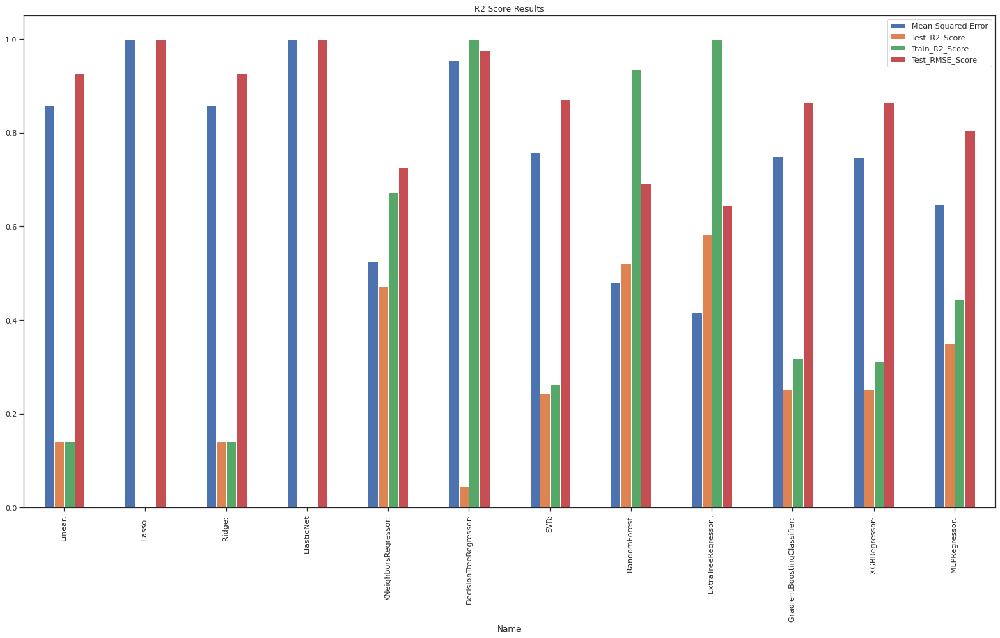

In [195]:
#visualization

df.plot(x="Name", y=['Mean Squared Error','Test_R2_Score' , 'Train_R2_Score' , 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' , figsize= (25,13)) ;


# Obervations

1. Best results over test set are given by Extra Tree Regressor with R2 score of 0.63

2. Least RMSE score is also by Extra Tree Regressor 0.6

3. Lasso regularization over Linear regression was worst performing model



# Let's try running Grid Search with cross validation and check...
GridSearchCVis a technique to search through the best parameter values from the given set of the grid of
parameters. It is basically a cross-validation method. the model and the parameters are required to be fed in. Best
parameter values are extracted and then the predictions are made.

# Running Grid Search Cross Validation for Ridge Regression

In [65]:
#Hyperparameter tuning

ridge = Ridge()
parameters = {'alpha': [1e-15,1e-10, 1e-8, 1e-5, 1e-4, 1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)
ridge_regressor.fit(train_X,train_y)

GridSearchCV(cv=3, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [66]:
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 20}

Using  {'alpha': 20}  the negative mean squared error is:  -0.8665559898317255


In [67]:
#Model Prediction

y_pred_ridge_cv = ridge_regressor.predict(test_X)

In [68]:
MSE = mean_squared_error ((test_y), (y_pred_ridge_cv))
print("MSE :" ,MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((test_y), (y_pred_ridge_cv))
print("R2 :" ,r2)
# print( Adjusted R2 : ,1-(l-r2_score(10**(y_test), 10** (y_pred_lasso)))"((x_test.shape[0]-1)/(x_test.shape[e]-x_test.shape[1]-1)))

MSE : 0.8783050756183859
RMSE : 0.9371793188170479
R2 : 0.12169492438161411


Running GridSearch doesn't work well here as it gave an R2 score of 0.12 and MSE value of 0.87,
 This model does'nt perform well at all.




# Running Grid Search Cross Validation for Elastic Net Regression

In [69]:
#Hyperparameter tuning

elastic = ElasticNet()
parameters = {'alpha': [1e-15,1e-10, 1e-8, 1e-5, 1e-4, 1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.3,0.4,0.5,0.6, 0.7,0.8]}
elastic_regressor = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error', cv=3)
elastic_regressor.fit(train_X,train_y)

GridSearchCV(cv=3, estimator=ElasticNet(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100],
                         'l1_ratio': [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]},
             scoring='neg_mean_squared_error')

In [70]:
print("The best fit alpha value is found out to be :" ,elastic_regressor.best_params_)
print("\nUsing ",elastic_regressor.best_params_, " the negative mean squared error is: ", elastic_regressor.best_score_)

The best fit alpha value is found out to be : {'alpha': 0.001, 'l1_ratio': 0.8}

Using  {'alpha': 0.001, 'l1_ratio': 0.8}  the negative mean squared error is:  -0.8663913844056208


In [71]:
#Model Prediction

y_pred_elastic = elastic_regressor.predict(test_X)

In [72]:
MSE = mean_squared_error ((test_y), (y_pred_elastic))
print("MSE :" ,MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((test_y), (y_pred_elastic))
print("R2 :" ,r2)
# print( Adjusted R2 : ,1-(l-r2_score(10**(y_test), 10** (y_pred_lasso)))"((x_test.shape[0]-1)/(x_test.shape[e]-x_test.shape[1]-1)))

MSE : 0.8783010960633606
RMSE : 0.9371771956590497
R2 : 0.1216989039366394


Similar Results as Ridge Regression.

# Running Grid Search Cross Validation for Decision Tree Regression

In [89]:
#Hyperparameter tuning

dt_reg = DecisionTreeRegressor()
grid_values = {'max_leaf_nodes':[100,125,150,175,200], 'min_samples_split': [10,15,20], 'splitter':["best","random"]}
dt_reg_cv = GridSearchCV(dt_reg, param_grid = grid_values, scoring = 'neg_mean_squared_error', cv=3)

# Fit the object to train dataset
dt_reg_cv.fit(train_X,train_y)

GridSearchCV(cv=3, estimator=DecisionTreeRegressor(),
             param_grid={'max_leaf_nodes': [100, 125, 150, 175, 200],
                         'min_samples_split': [10, 15, 20],
                         'splitter': ['best', 'random']},
             scoring='neg_mean_squared_error')

In [90]:
#best parameters for Dt regressor decided by Gridsearch

dt_reg_cv.best_params_

{'max_leaf_nodes': 150, 'min_samples_split': 20, 'splitter': 'random'}

In [91]:
train_preds_dt_cv = dt_reg_cv.predict(train_X)
test_preds_dt_cv = dt_reg_cv.predict(test_X)

In [92]:
r2_train = r2_score((train_y),(train_preds_dt_cv))
r2_train

0.30834358792730654

In [93]:
MSE = mean_squared_error ((test_y), (test_preds_dt_cv))
print("MSE :" ,MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((test_y), (test_preds_dt_cv))
print("R2 :" ,r2)


MSE : 0.841920782052869
RMSE : 0.9175624131648316
R2 : 0.15807921794713098


MSE score is 0.84 and R2 score is 0.15

# Running Grid Search Cross Validation for Random Forest Regressor



In [95]:
# hyperparameter tuning
rf_regressor = RandomForestRegressor(random_state= 7)
grid_values = {'n_estimators': [80, 90, 100, 150], 'max_depth': [3, 5, 7], 'min_samples_split': [2, 5, 10]}
rf_regressor = GridSearchCV(rf_regressor, param_grid = grid_values, scoring = 'neg_mean_squared_error', cv=3)

# Fit the object to train dataset
rf_regressor.fit(train_X,train_y)

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=7),
             param_grid={'max_depth': [3, 5, 7],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [80, 90, 100, 150]},
             scoring='neg_mean_squared_error')

In [96]:
train_preds_rf = rf_regressor.predict(train_X)
test_preds_rf = rf_regressor.predict(test_X)


In [97]:
rf_regressor.best_params_

{'max_depth': 7, 'min_samples_split': 2, 'n_estimators': 150}

In [98]:
r2_train = r2_score((train_y), (train_preds_rf))
r2_train

0.3763711103170737

In [99]:
MSE = mean_squared_error ((test_y), (test_preds_rf))
print("MSE :" ,MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score((test_y), (test_preds_rf))
print("R2 :" ,r2)


MSE : 0.7581378019114188
RMSE : 0.8707110898061531
R2 : 0.24186219808858123


MSE score is 0.75 and R2 score is 0.24

# Running Grid Search Cross Validation for ExtraTree Regressor


In [102]:
#Hyperparameter tuning

from sklearn.model_selection import GridSearchCV
param_grid = [{
              'max_depth': [80, 150, 200,250],
              'n_estimators' : [100,150,200,250],
              'max_features': ["auto", "sqrt", "log2"]
            }]
reg = ExtraTreesRegressor(random_state=40)
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = reg, param_grid = param_grid, cv = 5, n_jobs = -1 , scoring='r2' , verbose=2)
grid_search.fit(train_X, train_y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5, estimator=ExtraTreesRegressor(random_state=40), n_jobs=-1,
             param_grid=[{'max_depth': [80, 150, 200, 250],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'n_estimators': [100, 150, 200, 250]}],
             scoring='r2', verbose=2)

In [113]:
grid_search.best_params_

{'max_depth': 80, 'max_features': 'sqrt', 'n_estimators': 150}

In [196]:
# R2 score on training set with tuned parameters

print("R2 score on training set with tuned parameters is",grid_search.best_estimator_.score(train_X,train_y))
print("R2 score on test set with tuned parameters is",grid_search.best_estimator_.score(test_X,test_y))
print("MSE score with tuned parameters is",mean_squared_error((test_y), grid_search.best_estimator_.predict(test_X)))
print("RMSE score on test set with tuned parameters is",np.sqrt(mean_squared_error(test_y, grid_search.best_estimator_.predict(test_X))))


R2 score on training set with tuned parameters is 0.8553380868746383
R2 score on test set with tuned parameters is 0.7705921978788131
MSE score with tuned parameters is 0.22940780212118694
RMSE score on test set with tuned parameters is 0.4789653454282334



# Observations

Based on parameter tunning step we can see that

1. Best possible parameter combination are - 'max_depth': 80, 'max_features': 'sqrt', 'n_estimators': 200

2. Training set R2 score of 1.0 may be signal of overfitting on training set

3. Test set R2 score is 0.63 improvement over 0.57 achieved using untuned model

4. Test set RMSE score is 0.60 improvement over 0.65 achieved using untuned model



# Feature Importance

In [200]:
# Get sorted list of features in order of importance
feature_indices = np.argsort(grid_search.best_estimator_.feature_importances_)

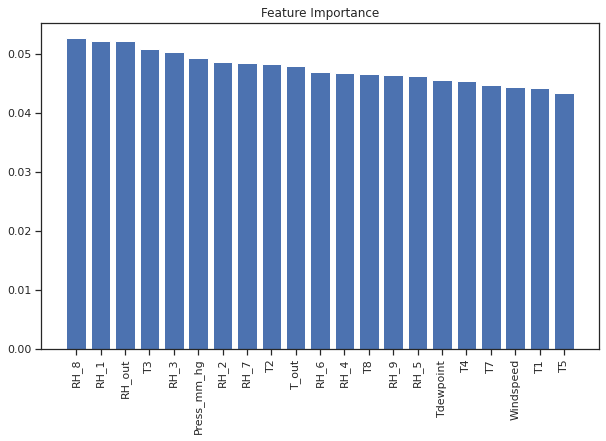

In [201]:
importances = grid_search.best_estimator_.feature_importances_
indices = np.argsort(importances)[::-1]
names = [train_X.columns[i] for i in indices]
# Create plot
plt.figure(figsize=(10,6))

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(train_X.shape[1]), importances[indices])

# Add feature names as x-axis labels
plt.xticks(range(train_X.shape[1]), names, rotation=90)

# Show plot
plt.show()

In [202]:
# Get top 5 most important feature 
names[0:5]


['RH_8', 'RH_1', 'RH_out', 'T3', 'RH_3']

In [203]:
# Get 5 least important feature 
names[-5:]

['T4', 'T7', 'Windspeed', 'T1', 'T5']

In [204]:
# Reduce test & training set to 5 feature set
train_important_feature = train_X[names[0:5]]
test_important_feature = test_X[names[0:5]]


In [205]:
# Clone the Gridsearch model with this parameter and fit on reduced dataset

from sklearn.base import clone
cloned_model = clone(grid_search.best_estimator_)
cloned_model.fit(train_important_feature , train_y)

ExtraTreesRegressor(max_depth=80, max_features='sqrt', n_estimators=150,
                    random_state=40)

In [206]:
# Reduced dataset scores 

print('Training set R2 Score - ', metrics.r2_score(train_y,cloned_model.predict(train_important_feature)))
print('Testing set R2 Score - ', metrics.r2_score(test_y,cloned_model.predict(test_important_feature)))
print('Testing set MSE Score - ', mean_squared_error(test_y, cloned_model.predict(test_important_feature)))
print('Testing set RMSE Score - ', np.sqrt(mean_squared_error(test_y, cloned_model.predict(test_important_feature))))


Training set R2 Score -  0.9999855694841853
Testing set R2 Score -  0.47877237791404115
Testing set MSE Score -  0.5212276220859587
Testing set RMSE Score -  0.7219609560675416


# Observations

Based on parameter tunning step we can see that

1. 5 most important features are - 'RH_out', 'RH_8', 'RH_1', 'T3', 'RH_3'

2. 5 least important features are - 'T7','Tdewpoint','Windspeed','T1','T5'

As can be observed with R2 Score , compared to Tuned model 0.63 the R2 score has come down to 0.47 which is decrease of 16% .

The reduction in R2 score is high and we should not use reduced feature set for this data set




# Conclusion

1. Hour of the Day is the most important influencing parameter for Energy consumption

2. Overall Random Forest appears to closely fit with the test data

2. The best Algorithm to use for this dataset Extra Trees Regressor as it performed the best with default parameters.

2. The untuned model was able to explain 57% of variance on test set .

3. The tuned model was able to explain 63% of varaince on tese set which is improvement of 10%.

4. The final model had 22 features.

5. Feature reduction was not able to add to better R2 score.

6. Though light consumpstion appeared as highly correlated with Appliance electricity consumption, lights are having very low importance as a feature.

7. Weekends (Saturdays and Sundays) are observed to have high consumption of Electricity. (> 25% than Weekdays)

8. High Electricity consumption of >140Wh is observed during evening hours 16:00 to 20:00

9. According to best fit model , the 5 most and least important features

 The top 3 important features are humidity attributes, which leads to the conclusion that humidity affects power consumption more than temperature. Windspeed is least important as the speed of wind doesn’t affect power consumption inside the house. So controlling humidity inside the house may lead to energy savings.



# References

1. Kaggle - https://www.kaggle.com/

2. Analytics Vidhya - https://www.analyticsvidhya.com/

3. Medium - https://medium.com/